##  Acknowledgements

* Data set creation and learning code adapted from the PyTorch tutorial [Torchvision Object Detection Finetuning Tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)
* Code for plotting detection bounding boxes taken from the tutorial [Faster R-CNN Object Detection with PyTorch](https://www.learnopencv.com/faster-r-cnn-object-detection-with-pytorch/)

In [1]:
from typing import Sequence, Dict

import os
import random
import yaml

from PIL import Image
import numpy as np
import sys
try:
    sys.path.remove('/opt/ros/kinetic/lib/python2.7/dist-packages')
except:
    pass
import cv2
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

from engine import train_one_epoch, validate_one_epoch, evaluate
import utils
import transforms as T
import math

The function below will load a pretrained Faster R-CNN model and replace the final layer so that it matches our number of classes.

In [2]:
def get_model(num_classes):
    # we load Faster R-CNN pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # we get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # we finally replace the head of the pretrained model
    # so that it matches our number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

We also need to define paths where the trained detection model will be saved/can be loaded from, as well as a path for a file containing category metadata.

In [3]:
model_path = '/home/lucy/torch/torch_detector/faster_rcnn_ycb.pt'
class_metadata_file_path = '/home/lucy/torch/torch_detector/small_augmented/synthetic_images/small_ycb_classes.yaml'

We'll now read the class labels (and add the background as class 0).

In [4]:
with open(class_metadata_file_path) as file:
    class_metadata = yaml.load(file, Loader=yaml.FullLoader)
class_metadata[0] = '__background'
num_classes = len(class_metadata.keys())

# Training

We first set up various training parameters (number of training epochs, learning rate, training batch size) as well as data paths.

In [2]:
data_path = '/home/lucy/torch/torch_detector/small_augmented/synthetic_images/'
loss_file_name = '/home/lucy/torch/torch_detector/small_augmented/synthetic_images/fasterrcnn_ycb_loss.log'
val_loss_file_name = '/home/lucy/torch/torch_detector/small_augmented/synthetic_images/fasterrcnn_ycb_val_loss.log'

num_epochs = 15
training_batch_size = 2
test_batch_size = 1
learning_rate = 0.0001

We now create an interface to the YCB data set that processes the images and annotations.

In [3]:
class YCBDataset(object):
    def __init__(self, root, transforms, split_name):
        self.root = root
        self.transforms = transforms
        self.split_name = split_name
        self.data_list = []
        if os.path.isdir(self.root):
            self.data_list = self.__get_image_data(os.path.join(root, 'images', self.split_name),
                                                   os.path.join(root, self.split_name + '.yaml'))

    def __get_image_data(self, image_dir: str,
                         annotations_file_path: str) -> Sequence[Dict[str, str]]:
        '''Returns a list of dictionaries containing image paths and image
        annotations for all images in the given directory. Each dictionary
        in the resulting list is of the following format:
        {
            'img': path to an image (starting from image_dir),
            'annotations': a dictionary containing class labels and bounding
                           box annotations for all objects in the image
        }

        Keyword arguments:
        image_dir: str -- name of a directory with RGB images
        annotations_file_path: str -- path to an image annotation file

        '''
        image_list = []
        annotations = {}
        with open(annotations_file_path, 'r') as annotations_file:
            annotations = yaml.load(annotations_file)

        for x in os.listdir(image_dir):
            name, _ = x.split('.')
            image_data = {}
            img_name = name + '.jpg'

            image_data['img'] = os.path.join(image_dir, img_name)
            image_data['annotations'] = annotations[img_name]
            image_list.append(image_data)
        return image_list

    def __getitem__(self, idx: int):
        img_path = self.data_list[idx]['img']
        annotations = self.data_list[idx]['annotations']

        img = Image.open(img_path).convert("RGB")

        boxes = []
        labels = []
        for annotation in annotations:
            xmin = annotation['xmin']
            xmax = annotation['xmax']
            ymin = annotation['ymin']
            ymax = annotation['ymax']
            boxes.append([xmin, ymin, xmax, ymax])

            label = annotation['class_id']
            labels.append(label)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self) -> int:
        return len(self.data_list)

Let us now define a function for augmenting the data set during training by flipping the original images.

In [4]:
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

We now create data loaders for training and validation (using a 70%/30% split).

In [5]:
dataset = YCBDataset(data_path, get_transform(train=True), 'train')

# split the dataset in train and test set
indices = torch.randperm(len(dataset)).tolist()
train_split = math.ceil(0.7*len(indices)) 
val_split = math.ceil(0.2*len(indices))

dataset_train = torch.utils.data.Subset(dataset, indices[0:train_split])
dataset_val = torch.utils.data.Subset(dataset, indices[train_split:train_split + val_split])

# define training and validation data loaders
data_loader_train = torch.utils.data.DataLoader(dataset_train,
                                                batch_size=training_batch_size,
                                                shuffle=True, num_workers=4,
                                                collate_fn=utils.collate_fn)

data_loader_val = torch.utils.data.DataLoader(dataset_val,
                                              batch_size=training_batch_size,
                                              shuffle=True, num_workers=4,
                                              collate_fn=utils.collate_fn)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:30: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.


We finally load a Faster R-CNN model (pretrained on COCO) and train on our data set.

In [7]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model(num_classes)

# we now define an optimiser, and train
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=learning_rate)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# we move the model to the correct device before training
model.to(device)
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader_train, device, epoch,
                    print_freq=10, loss_file_name=loss_file_name)
    lr_scheduler.step()
    validate_one_epoch(model, data_loader_val, device, epoch,
                       print_freq=10, loss_file_name=val_loss_file_name)

Epoch: [0]  [  0/147]  eta: 0:03:30  lr: 0.000001  loss_box_reg: 0.4152 (0.4152)  loss_classifier: 2.6221 (2.6221)  loss_rpn_box_reg: 0.0299 (0.0299)  loss: 3.0932 (3.0932)  loss_objectness: 0.0259 (0.0259)  time: 1.4353  data: 0.5226  max mem: 2815
Epoch: [0]  [ 10/147]  eta: 0:01:19  lr: 0.000008  loss_box_reg: 0.4567 (0.4696)  loss_classifier: 2.5507 (2.5066)  loss_rpn_box_reg: 0.0287 (0.0275)  loss: 3.0932 (3.0746)  loss_objectness: 0.0499 (0.0710)  time: 0.5791  data: 0.0525  max mem: 3248
Epoch: [0]  [ 20/147]  eta: 0:01:09  lr: 0.000014  loss_box_reg: 0.4567 (0.4701)  loss_classifier: 2.1179 (2.1233)  loss_rpn_box_reg: 0.0225 (0.0259)  loss: 2.6762 (2.6929)  loss_objectness: 0.0346 (0.0735)  time: 0.4988  data: 0.0058  max mem: 3248
Epoch: [0]  [ 30/147]  eta: 0:01:02  lr: 0.000021  loss_box_reg: 0.4494 (0.4715)  loss_classifier: 1.1146 (1.7390)  loss_rpn_box_reg: 0.0225 (0.0266)  loss: 1.7379 (2.3095)  loss_objectness: 0.0332 (0.0724)  time: 0.5100  data: 0.0060  max mem: 3248


Epoch: [1]  [100/147]  eta: 0:00:23  lr: 0.000100  loss_box_reg: 0.1352 (0.1687)  loss_classifier: 0.2373 (0.2985)  loss_rpn_box_reg: 0.0230 (0.0267)  loss: 0.4074 (0.5093)  loss_objectness: 0.0107 (0.0154)  time: 0.5039  data: 0.0060  max mem: 4124
Epoch: [1]  [110/147]  eta: 0:00:18  lr: 0.000100  loss_box_reg: 0.1372 (0.1667)  loss_classifier: 0.2373 (0.2960)  loss_rpn_box_reg: 0.0217 (0.0262)  loss: 0.4074 (0.5036)  loss_objectness: 0.0103 (0.0147)  time: 0.5158  data: 0.0060  max mem: 4124
Epoch: [1]  [120/147]  eta: 0:00:13  lr: 0.000100  loss_box_reg: 0.1430 (0.1658)  loss_classifier: 0.2423 (0.2927)  loss_rpn_box_reg: 0.0206 (0.0259)  loss: 0.4046 (0.4983)  loss_objectness: 0.0033 (0.0138)  time: 0.5026  data: 0.0061  max mem: 4124
Epoch: [1]  [130/147]  eta: 0:00:08  lr: 0.000100  loss_box_reg: 0.1302 (0.1629)  loss_classifier: 0.2223 (0.2864)  loss_rpn_box_reg: 0.0206 (0.0258)  loss: 0.3733 (0.4890)  loss_objectness: 0.0037 (0.0139)  time: 0.4845  data: 0.0061  max mem: 4124


------------------------------Epoch: [2]  [40/42]  eta: 0:00:00  loss_classifier: 0.2017 (0.1907)  loss_rpn_box_reg: 0.0185 (0.0219)  loss: 0.3603 (0.3380)  loss_objectness: 0.0043 (0.0140)  loss_box_reg: 0.1134 (0.1113)  time: 0.2114  data: 0.0060  max mem: 4124
------------------------------Epoch: [2]  [41/42]  eta: 0:00:00  loss_classifier: 0.2017 (0.1926)  loss_rpn_box_reg: 0.0185 (0.0219)  loss: 0.3603 (0.3407)  loss_objectness: 0.0042 (0.0138)  loss_box_reg: 0.1134 (0.1124)  time: 0.2112  data: 0.0060  max mem: 4124
------------------------------Epoch: [2] Total time: 0:00:09 (0.2228 s / it)
Epoch: [3]  [  0/147]  eta: 0:02:07  lr: 0.000010  loss_box_reg: 0.1160 (0.1160)  loss_classifier: 0.2203 (0.2203)  loss_rpn_box_reg: 0.0206 (0.0206)  loss: 0.3736 (0.3736)  loss_objectness: 0.0168 (0.0168)  time: 0.8662  data: 0.4003  max mem: 4124
Epoch: [3]  [ 10/147]  eta: 0:01:11  lr: 0.000010  loss_box_reg: 0.1116 (0.1048)  loss_classifier: 0.1857 (0.1914)  loss_rpn_box_reg: 0.0179 (0.0

Epoch: [4]  [ 80/147]  eta: 0:00:33  lr: 0.000010  loss_box_reg: 0.0558 (0.0687)  loss_classifier: 0.0963 (0.1222)  loss_rpn_box_reg: 0.0115 (0.0143)  loss: 0.1614 (0.2078)  loss_objectness: 0.0008 (0.0025)  time: 0.5031  data: 0.0060  max mem: 4125
Epoch: [4]  [ 90/147]  eta: 0:00:28  lr: 0.000010  loss_box_reg: 0.0444 (0.0676)  loss_classifier: 0.0959 (0.1217)  loss_rpn_box_reg: 0.0135 (0.0144)  loss: 0.1605 (0.2063)  loss_objectness: 0.0008 (0.0026)  time: 0.5155  data: 0.0060  max mem: 4125
Epoch: [4]  [100/147]  eta: 0:00:23  lr: 0.000010  loss_box_reg: 0.0455 (0.0669)  loss_classifier: 0.0959 (0.1204)  loss_rpn_box_reg: 0.0137 (0.0145)  loss: 0.1605 (0.2043)  loss_objectness: 0.0009 (0.0025)  time: 0.5095  data: 0.0060  max mem: 4125
Epoch: [4]  [110/147]  eta: 0:00:18  lr: 0.000010  loss_box_reg: 0.0501 (0.0666)  loss_classifier: 0.1043 (0.1202)  loss_rpn_box_reg: 0.0150 (0.0146)  loss: 0.1890 (0.2038)  loss_objectness: 0.0009 (0.0024)  time: 0.5093  data: 0.0061  max mem: 4125


------------------------------Epoch: [5]  [20/42]  eta: 0:00:05  loss_classifier: 0.1462 (0.1620)  loss_rpn_box_reg: 0.0163 (0.0183)  loss: 0.2485 (0.2775)  loss_objectness: 0.0014 (0.0178)  loss_box_reg: 0.0756 (0.0795)  time: 0.2086  data: 0.0051  max mem: 4125
------------------------------Epoch: [5]  [30/42]  eta: 0:00:02  loss_classifier: 0.1455 (0.1569)  loss_rpn_box_reg: 0.0144 (0.0182)  loss: 0.2368 (0.2706)  loss_objectness: 0.0013 (0.0143)  loss_box_reg: 0.0767 (0.0813)  time: 0.2121  data: 0.0059  max mem: 4609
------------------------------Epoch: [5]  [40/42]  eta: 0:00:00  loss_classifier: 0.1485 (0.1623)  loss_rpn_box_reg: 0.0156 (0.0177)  loss: 0.2406 (0.2757)  loss_objectness: 0.0011 (0.0132)  loss_box_reg: 0.0776 (0.0825)  time: 0.2168  data: 0.0060  max mem: 4609
------------------------------Epoch: [5]  [41/42]  eta: 0:00:00  loss_classifier: 0.1224 (0.1613)  loss_rpn_box_reg: 0.0151 (0.0177)  loss: 0.2406 (0.2753)  loss_objectness: 0.0011 (0.0129)  loss_box_reg: 0.0

Epoch: [7]  [ 60/147]  eta: 0:00:44  lr: 0.000001  loss_box_reg: 0.0430 (0.0511)  loss_classifier: 0.0873 (0.0948)  loss_rpn_box_reg: 0.0104 (0.0132)  loss: 0.1369 (0.1609)  loss_objectness: 0.0006 (0.0017)  time: 0.4968  data: 0.0061  max mem: 4609
Epoch: [7]  [ 70/147]  eta: 0:00:39  lr: 0.000001  loss_box_reg: 0.0278 (0.0496)  loss_classifier: 0.0782 (0.0920)  loss_rpn_box_reg: 0.0106 (0.0130)  loss: 0.1189 (0.1563)  loss_objectness: 0.0004 (0.0017)  time: 0.5038  data: 0.0060  max mem: 4609
Epoch: [7]  [ 80/147]  eta: 0:00:34  lr: 0.000001  loss_box_reg: 0.0386 (0.0503)  loss_classifier: 0.0859 (0.0934)  loss_rpn_box_reg: 0.0113 (0.0128)  loss: 0.1361 (0.1582)  loss_objectness: 0.0008 (0.0016)  time: 0.5160  data: 0.0060  max mem: 4609
Epoch: [7]  [ 90/147]  eta: 0:00:28  lr: 0.000001  loss_box_reg: 0.0421 (0.0504)  loss_classifier: 0.0875 (0.0929)  loss_rpn_box_reg: 0.0095 (0.0126)  loss: 0.1432 (0.1575)  loss_objectness: 0.0010 (0.0016)  time: 0.5083  data: 0.0059  max mem: 4609


------------------------------Epoch: [8]  [ 0/42]  eta: 0:00:24  loss_classifier: 0.1192 (0.1192)  loss_rpn_box_reg: 0.0134 (0.0134)  loss: 0.2465 (0.2465)  loss_objectness: 0.0014 (0.0014)  loss_box_reg: 0.1125 (0.1125)  time: 0.5909  data: 0.3914  max mem: 4619
------------------------------Epoch: [8]  [10/42]  eta: 0:00:08  loss_classifier: 0.1571 (0.1559)  loss_rpn_box_reg: 0.0135 (0.0164)  loss: 0.2492 (0.2597)  loss_objectness: 0.0019 (0.0098)  loss_box_reg: 0.0729 (0.0776)  time: 0.2511  data: 0.0407  max mem: 4619
------------------------------Epoch: [8]  [20/42]  eta: 0:00:05  loss_classifier: 0.1376 (0.1428)  loss_rpn_box_reg: 0.0134 (0.0150)  loss: 0.2401 (0.2428)  loss_objectness: 0.0019 (0.0158)  loss_box_reg: 0.0714 (0.0691)  time: 0.2117  data: 0.0057  max mem: 4619
------------------------------Epoch: [8]  [30/42]  eta: 0:00:02  loss_classifier: 0.1421 (0.1634)  loss_rpn_box_reg: 0.0144 (0.0169)  loss: 0.2542 (0.2719)  loss_objectness: 0.0009 (0.0140)  loss_box_reg: 0.0

Epoch: [10]  [ 40/147]  eta: 0:00:55  lr: 0.000000  loss_box_reg: 0.0448 (0.0512)  loss_classifier: 0.0801 (0.0926)  loss_rpn_box_reg: 0.0113 (0.0132)  loss: 0.1485 (0.1591)  loss_objectness: 0.0005 (0.0021)  time: 0.4967  data: 0.0060  max mem: 4619
Epoch: [10]  [ 50/147]  eta: 0:00:49  lr: 0.000000  loss_box_reg: 0.0396 (0.0494)  loss_classifier: 0.0956 (0.0929)  loss_rpn_box_reg: 0.0114 (0.0131)  loss: 0.1485 (0.1572)  loss_objectness: 0.0004 (0.0019)  time: 0.4969  data: 0.0060  max mem: 4619
Epoch: [10]  [ 60/147]  eta: 0:00:44  lr: 0.000000  loss_box_reg: 0.0446 (0.0513)  loss_classifier: 0.0918 (0.0928)  loss_rpn_box_reg: 0.0122 (0.0134)  loss: 0.1497 (0.1593)  loss_objectness: 0.0004 (0.0018)  time: 0.5020  data: 0.0060  max mem: 4619
Epoch: [10]  [ 70/147]  eta: 0:00:38  lr: 0.000000  loss_box_reg: 0.0622 (0.0525)  loss_classifier: 0.0918 (0.0927)  loss_rpn_box_reg: 0.0127 (0.0133)  loss: 0.1624 (0.1602)  loss_objectness: 0.0009 (0.0017)  time: 0.4892  data: 0.0059  max mem: 4

Epoch: [11]  [140/147]  eta: 0:00:03  lr: 0.000000  loss_box_reg: 0.0436 (0.0526)  loss_classifier: 0.0815 (0.0924)  loss_rpn_box_reg: 0.0119 (0.0137)  loss: 0.1432 (0.1603)  loss_objectness: 0.0006 (0.0017)  time: 0.4978  data: 0.0062  max mem: 4619
Epoch: [11]  [146/147]  eta: 0:00:00  lr: 0.000000  loss_box_reg: 0.0525 (0.0529)  loss_classifier: 0.0834 (0.0932)  loss_rpn_box_reg: 0.0113 (0.0135)  loss: 0.1539 (0.1613)  loss_objectness: 0.0007 (0.0017)  time: 0.5099  data: 0.0062  max mem: 4619
Epoch: [11] Total time: 0:01:13 (0.4979 s / it)
------------------------------Epoch: [11]  [ 0/42]  eta: 0:00:27  loss_classifier: 0.0852 (0.0852)  loss_rpn_box_reg: 0.0130 (0.0130)  loss: 0.1288 (0.1288)  loss_objectness: 0.0004 (0.0004)  loss_box_reg: 0.0302 (0.0302)  time: 0.6440  data: 0.3923  max mem: 4619
------------------------------Epoch: [11]  [10/42]  eta: 0:00:07  loss_classifier: 0.1109 (0.1252)  loss_rpn_box_reg: 0.0154 (0.0175)  loss: 0.2252 (0.2233)  loss_objectness: 0.0010 (0.

Epoch: [13]  [ 10/147]  eta: 0:01:14  lr: 0.000000  loss_box_reg: 0.0457 (0.0499)  loss_classifier: 0.0927 (0.1046)  loss_rpn_box_reg: 0.0125 (0.0122)  loss: 0.1451 (0.1681)  loss_objectness: 0.0009 (0.0013)  time: 0.5441  data: 0.0398  max mem: 4619
Epoch: [13]  [ 20/147]  eta: 0:01:05  lr: 0.000000  loss_box_reg: 0.0404 (0.0466)  loss_classifier: 0.0914 (0.1001)  loss_rpn_box_reg: 0.0125 (0.0136)  loss: 0.1388 (0.1616)  loss_objectness: 0.0005 (0.0013)  time: 0.4961  data: 0.0058  max mem: 4619
Epoch: [13]  [ 30/147]  eta: 0:00:59  lr: 0.000000  loss_box_reg: 0.0458 (0.0504)  loss_classifier: 0.0973 (0.1032)  loss_rpn_box_reg: 0.0144 (0.0146)  loss: 0.1420 (0.1696)  loss_objectness: 0.0006 (0.0013)  time: 0.4844  data: 0.0061  max mem: 4619
Epoch: [13]  [ 40/147]  eta: 0:00:54  lr: 0.000000  loss_box_reg: 0.0549 (0.0536)  loss_classifier: 0.1104 (0.1026)  loss_rpn_box_reg: 0.0129 (0.0145)  loss: 0.1929 (0.1719)  loss_objectness: 0.0006 (0.0012)  time: 0.4966  data: 0.0061  max mem: 4

Epoch: [14]  [110/147]  eta: 0:00:18  lr: 0.000000  loss_box_reg: 0.0508 (0.0526)  loss_classifier: 0.0780 (0.0928)  loss_rpn_box_reg: 0.0116 (0.0137)  loss: 0.1504 (0.1606)  loss_objectness: 0.0007 (0.0015)  time: 0.4975  data: 0.0059  max mem: 4619
Epoch: [14]  [120/147]  eta: 0:00:13  lr: 0.000000  loss_box_reg: 0.0508 (0.0535)  loss_classifier: 0.0941 (0.0950)  loss_rpn_box_reg: 0.0110 (0.0136)  loss: 0.1504 (0.1637)  loss_objectness: 0.0006 (0.0016)  time: 0.5221  data: 0.0059  max mem: 4619
Epoch: [14]  [130/147]  eta: 0:00:08  lr: 0.000000  loss_box_reg: 0.0365 (0.0533)  loss_classifier: 0.1008 (0.0959)  loss_rpn_box_reg: 0.0112 (0.0136)  loss: 0.1506 (0.1644)  loss_objectness: 0.0008 (0.0015)  time: 0.5089  data: 0.0059  max mem: 4619
Epoch: [14]  [140/147]  eta: 0:00:03  lr: 0.000000  loss_box_reg: 0.0365 (0.0527)  loss_classifier: 0.0774 (0.0946)  loss_rpn_box_reg: 0.0112 (0.0134)  loss: 0.1356 (0.1622)  loss_objectness: 0.0009 (0.0016)  time: 0.4781  data: 0.0060  max mem: 4

Let us now investigate the training and validation losses during training.

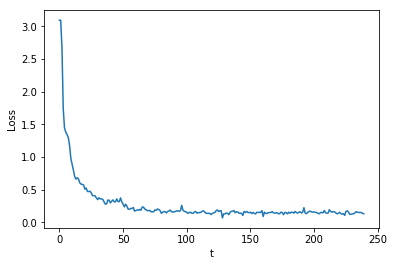

In [8]:
losses = np.genfromtxt(loss_file_name)
plt.plot(losses)
plt.xlabel('t')
plt.ylabel('Loss')
plt.show()

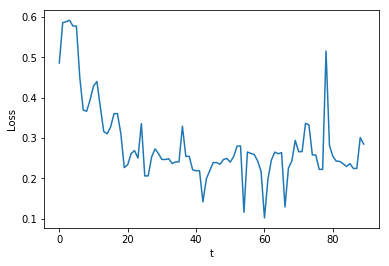

In [9]:
val_losses = np.genfromtxt(val_loss_file_name)
plt.plot(val_losses)
plt.xlabel('t')
plt.ylabel('Loss')
plt.show()

Finally, we save the trained model for later use.

In [10]:
torch.save(model.state_dict(), model_path)

# Testing

Let us now check what the model has learned. We will first load the model from the model path, set it to evaluation mode, and copy it to the correct device.

In [5]:
model = get_model(num_classes)
model.load_state_dict(torch.load(model_path))
model.eval()

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

The functions below are utilities for running the model on a single image and plotting the detections along with their labels.

In [6]:
def get_prediction(img_path, class_metadata, threshold):
    img = Image.open(img_path)
    transform = T.ToTensor()
    img, _ = transform(img, None)
    with torch.no_grad():
        pred = model([img.to(device)])
    pred_class = [class_metadata[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].cpu().detach().numpy())]
    pred_score = list(pred[0]['scores'].cpu().detach().numpy())
    pred_t = [i for i, x in enumerate(pred_score) if x > threshold]
    if not pred_t:
        return [], []
    else:
        pred_t = pred_t[-1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return pred_boxes, pred_class

def detect_objects(img_path, class_metadata, threshold=0.5, rect_th=10,
                   text_size=1, text_th=3):
    boxes, pred_cls = get_prediction(img_path, class_metadata, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(boxes)):
        cv2.rectangle(img, boxes[i][0], boxes[i][1],
                      color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img, pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX,
                    text_size, (255,0,0), thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

We will first check the model on some of the training images.

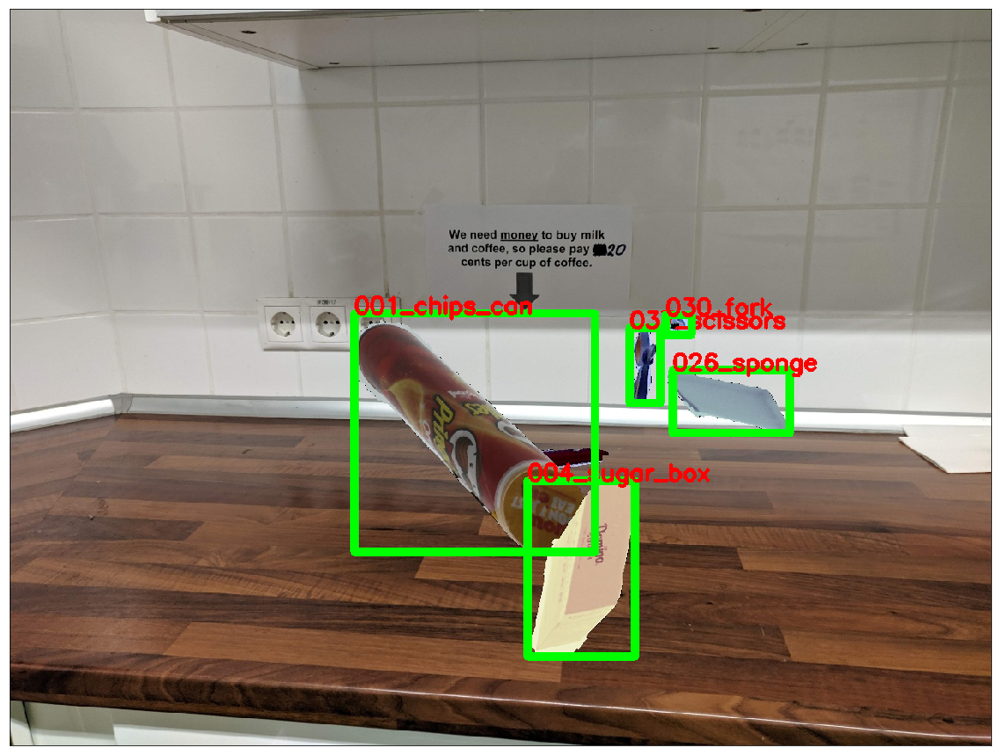

In [7]:
detect_objects('/home/lucy/torch/torch_detector/small_augmented/synthetic_images/images/train/demo_060.jpg',
               class_metadata, threshold=0.8)

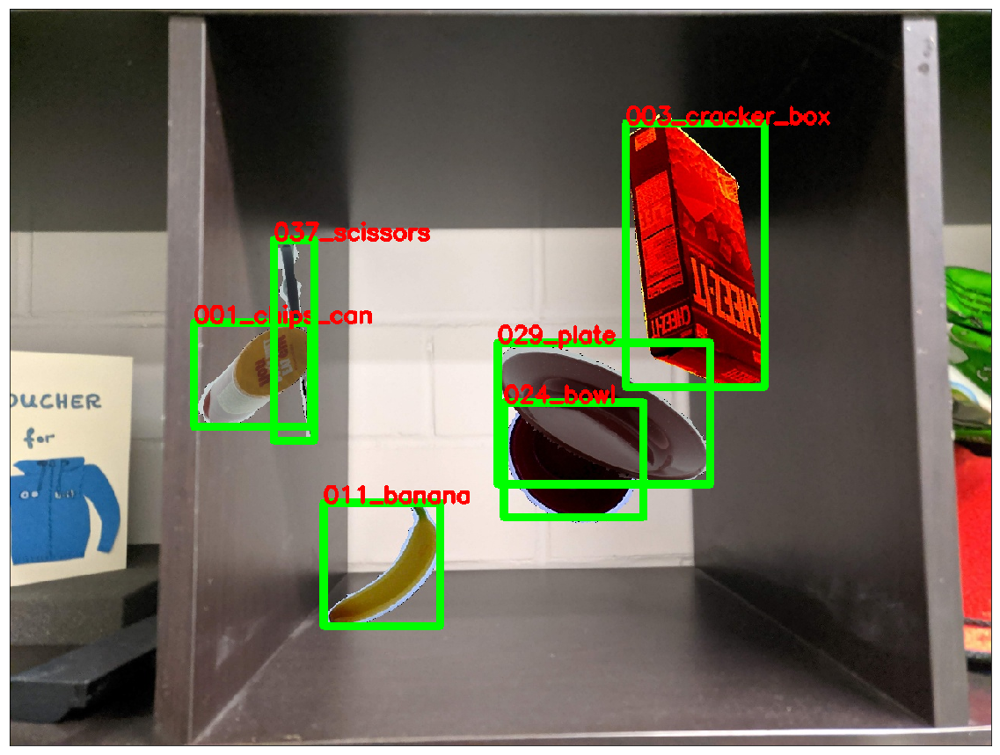

In [8]:
detect_objects('/home/lucy/torch/torch_detector/small_augmented/synthetic_images/images/train/demo_125.jpg',
               class_metadata, threshold=0.8)

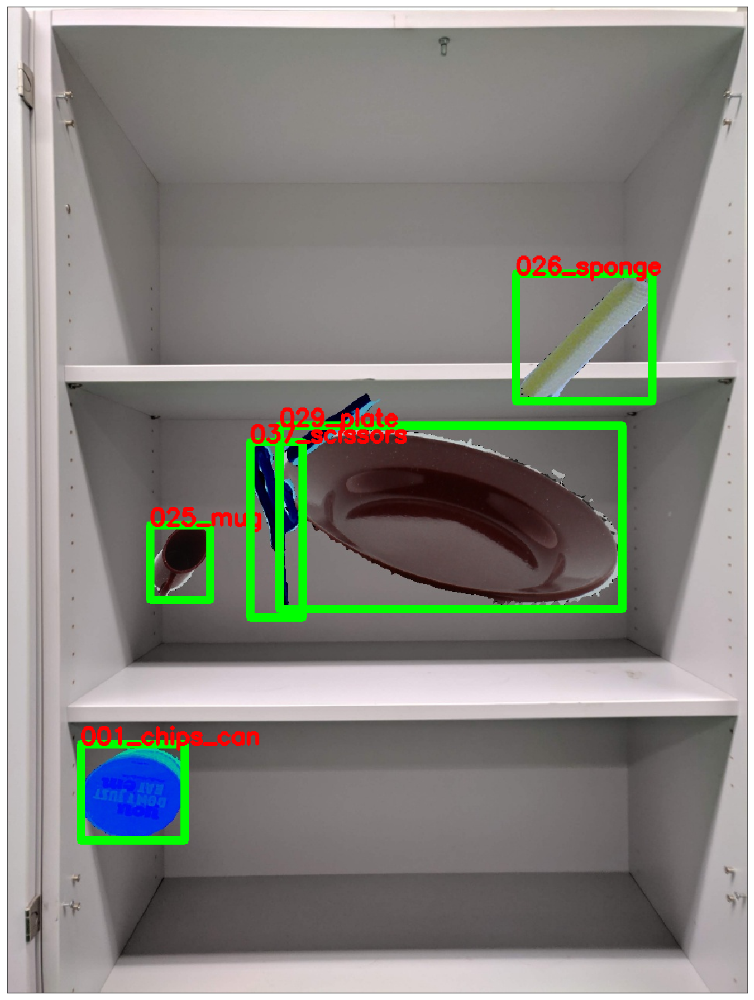

In [9]:
detect_objects('/home/lucy/torch/torch_detector/small_augmented/synthetic_images/images/train/demo_300.jpg',
               class_metadata, threshold=0.8)

The detections and classification results look reasonable here. this is consistent with the low training loss.

Let us see what the model detects on some of the validation images; according to the validation loss, the results should be worse there (suggesting that the model is not generalising well enough).

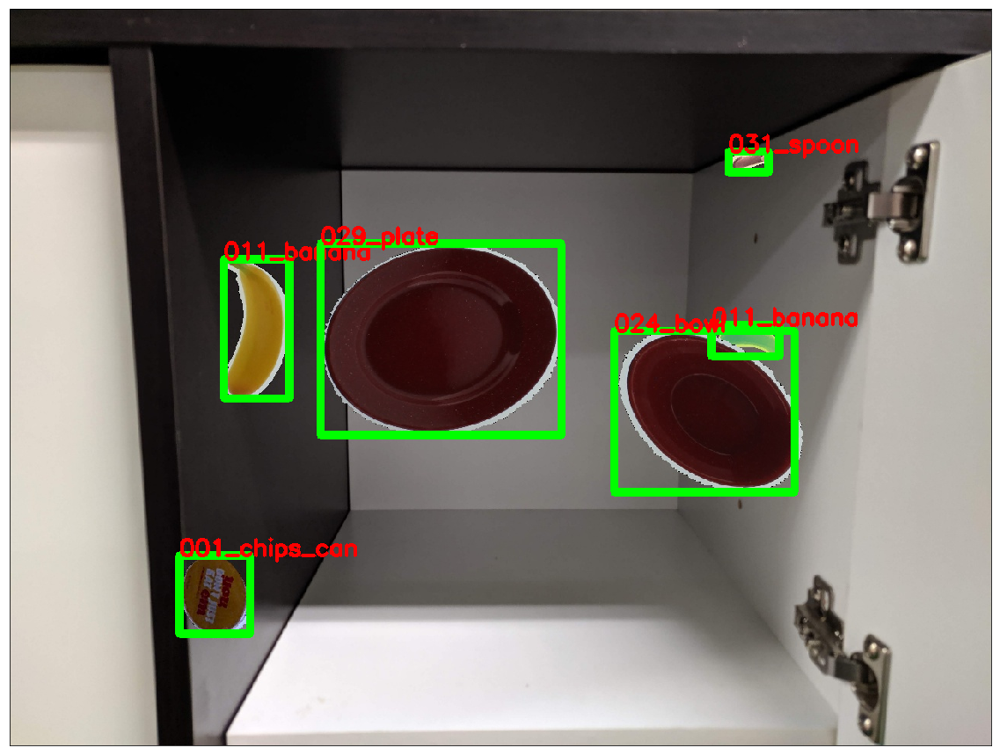

In [12]:
detect_objects('/home/lucy/torch/torch_detector/small_augmented/synthetic_images/images/train/demo_430.jpg',
               class_metadata, threshold=0.8)

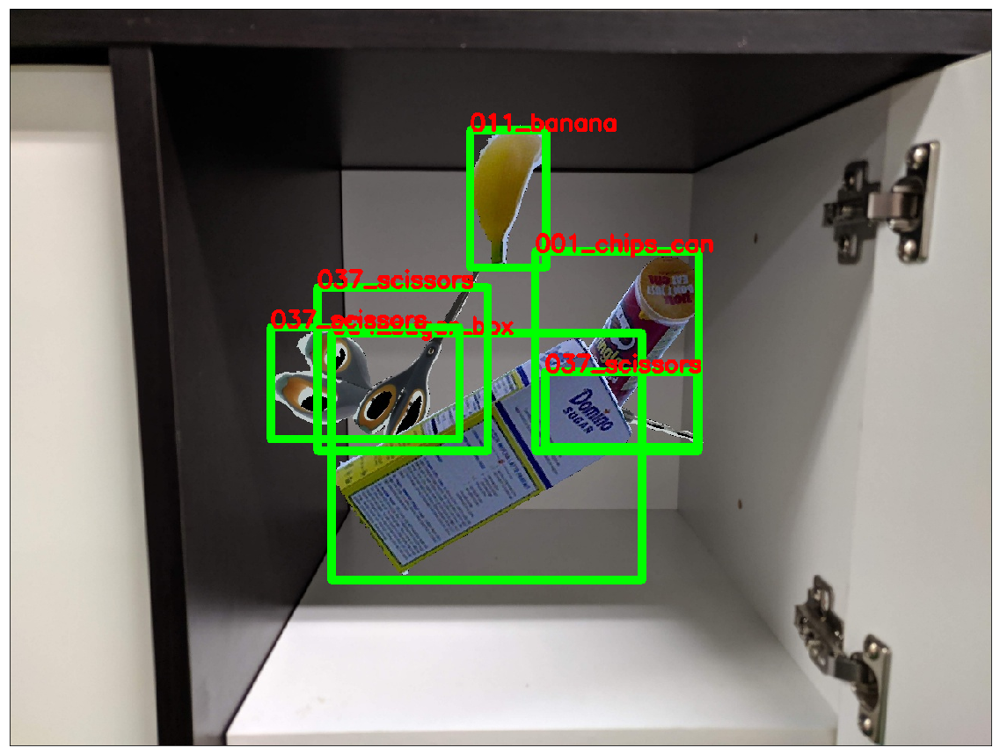

In [13]:
detect_objects('/home/lucy/torch/torch_detector/small_augmented/synthetic_images/images/train/demo_476.jpg',
               class_metadata, threshold=0.8)

This doesn't seem to be too bad either. All images above are however artificially generated images. Let us check if the model is able to correctly detect and classify objects on real images.

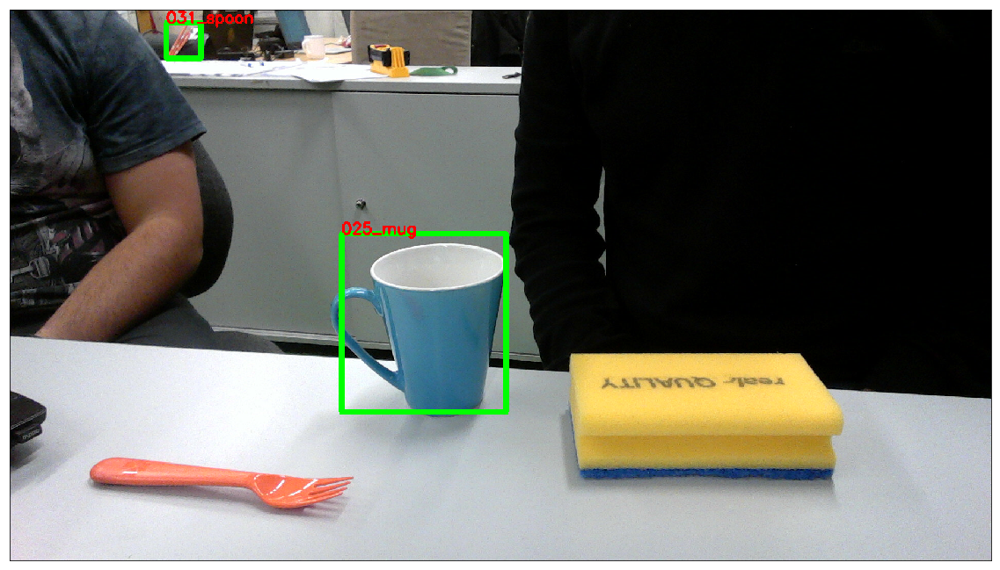

In [20]:
detect_objects('/home/lucy/cam.jpg', class_metadata, threshold=0.7)

In this case, only the mug is detected (but with a confidence lower than 80%). There's also a false positive detection of a spoon. Neither the fork nor the sponge are detected unfortunately.

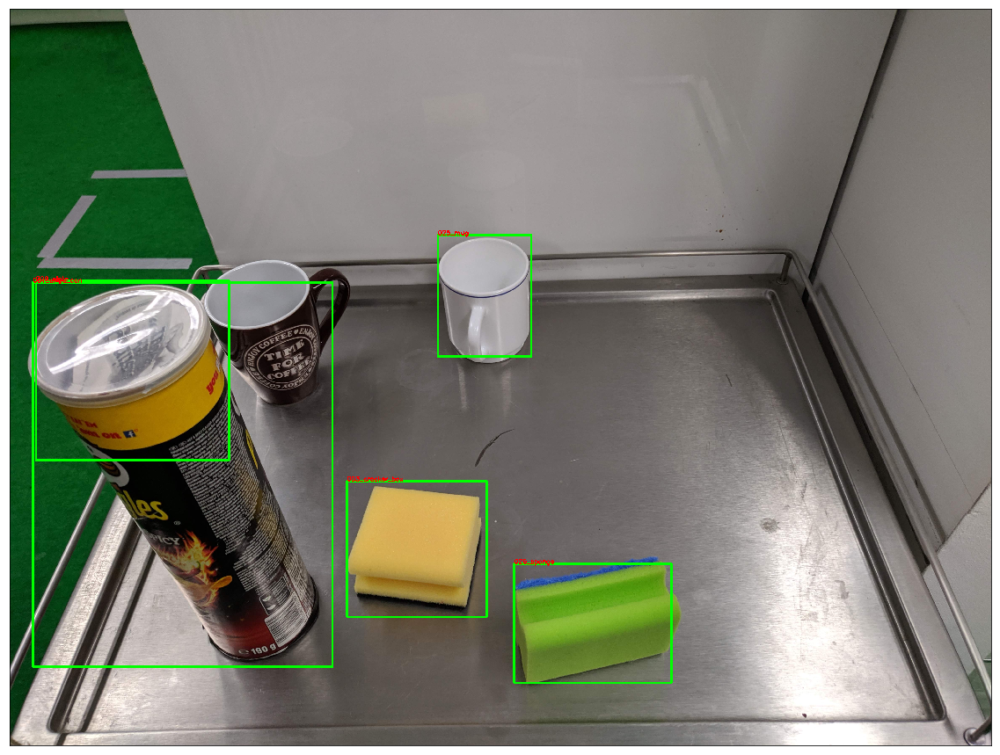

In [21]:
detect_objects('/home/lucy/torch/torch_detector/domestic_ycb/images/train/IMG_20191220_164840.jpg',
               class_metadata, threshold=0.8)

The detections on this image are rather reasonable; however, one of the sponges is misclassified as a cracker box, the top of the chips can is detected as a plate, and one of the mugs is not detected.

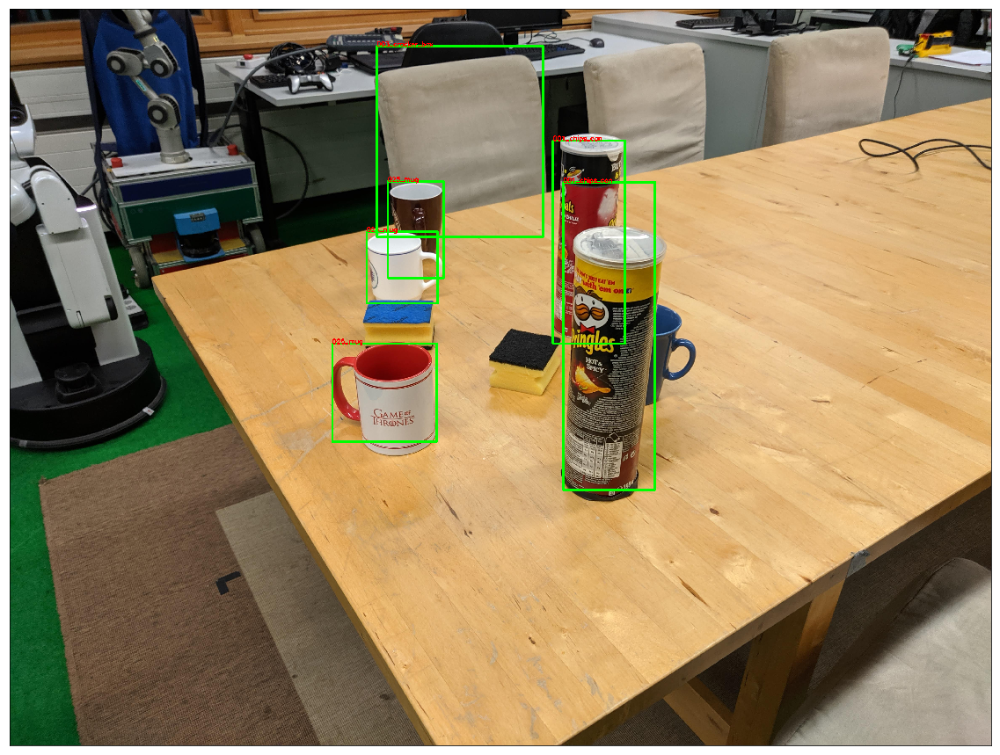

In [22]:
detect_objects('/home/lucy/torch/torch_detector/domestic_ycb/images/train/IMG_20191220_164639.jpg',
               class_metadata, threshold=0.8)

The detections are also mostly reasonable on the above image, but the chair is also detected (as a cracker box); the sponges on the table are not detected.